<a href="https://colab.research.google.com/github/sophia-zxy/CA03-decision-tree/blob/main/CA03_Decision_Tree_Algorithm_Xinyu_zhou.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CA03 – Decision Tree Algorithm**
Name: Xinyu Zhou

Colab link: https://colab.research.google.com/drive/1rMkdMBj7Cd13Yj7UBZzrHce3SXU0kDFG?usp=sharing

# **1. Data Source and Contents**

Q.1.1 Why does it makes sense to discretize columns for this problem?

Our target classes is two, ('>50K' and '<=50K') [ Labels: 1, 0 ], using discretization, we convert a continuous Variable into a Categorical Variable ( two classes) based on salary. Then we can use these two classes as input to a predictive model.

Q.1.2	What might be the issues (if any) if we DID NOT discretize the columns.

We can not predict the result and the classification would not work. The regression will be the option.

# **2. Data Quality Analysis (DQA)**

*	Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.
*	Display descriptive statistics of each column
*	Perform necessary data cleansing and transformation based on your observations from the data quality analysis




In [ ]:
# Import pandas and numpy
import pandas as pd
import numpy as np

# Read the CSV file
df = pd.read_csv('census_data.csv',na_values='NA')

In [ ]:
#Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.
df.isnull().sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [ ]:
#Display descriptive statistics of each column
df.describe()
df.head()
# Data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [ ]:
#Perform necessary data cleansing and transformation based on your observations from the data quality analysis

#create a new column with corresponding 1 and 0 value for target column
df['flagNumber']=df.flag.map({ 'train' : 1, 'test' : 0})

In [ ]:
df.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y,flagNumber
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0,1
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0,1
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0,1
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0,1
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0,1


# **3. Exploratory Data Analysis (EDA)**
Perform EDA of the income group with respect to the seven explanatory variables and display graphical representations as shown below. Do all of these inside your Notebook


1.  Age(5 bins)
2.  Capital Gain/Loss (3 bins)
3.  Education (5 bins)
4.  Hours per Week (5 bins)
5.  Marriage Status and Relationship (3 bins)
6.  Occupation (5 bins)
7.  Race and Sex (3 bins)

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
# define a function
def variables_graph(var_name):
    df_slice=df[[var_name,'y']]   #slice the dataset
    # create dataset with number of people have less than 50K salary
    df_slice_less=df_slice[df['y']==0].groupby([var_name]).count()
    df_slice_less=df_slice_less.rename(columns={"y": "less than 50K"})
    # create dataset with number of people have greater than 50K salary
    df_slice_greater=df_slice[df['y']==1].groupby([var_name]).count()
    df_slice_greater=df_slice_greater.rename(columns={"y": "greater than 50k"})
    # merge two datasets
    df_slice_y = pd.merge(df_slice_less, df_slice_greater, on =var_name)
    #transform in percentage scale
    df_slice_y = df_slice_y.apply(lambda x: x*100/sum(x), axis=1)
    # sort the dataset
    df_slice_y=df_slice_y.sort_values('less than 50K',ascending=False)
    width = 0.35 
    plt.bar(df_slice_y.index, df_slice_y['greater than 50k'], width, label='>50K',bottom=df_slice_y['less than 50K'])
    plt.bar(df_slice_y.index, df_slice_y['less than 50K'], width,label='<=50K')
    plt.title(f'salary class by {var_name}')
    plt.xticks(rotation=90)
    plt.xlabel(var_name)
    plt.ylabel('Percentage')
    plt.legend(loc='best')
    plt.show()


Age(5 bins)

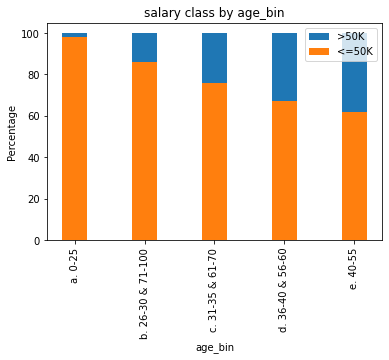

In [ ]:
 # call funtion
 variables_graph('age_bin')

Capital Gain/Loss (3 bins)

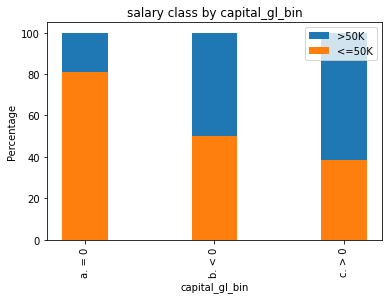

In [ ]:
 # call funtion
 variables_graph('capital_gl_bin')

Education (5 bins)

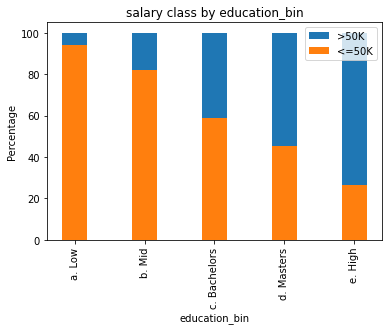

In [ ]:
 # call funtion
 variables_graph('education_bin')

Hours per Week (5 bins)

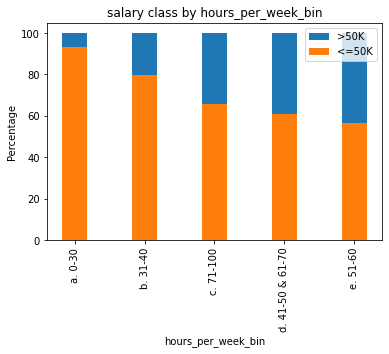

In [ ]:
 # call funtion
 variables_graph('hours_per_week_bin')

Marriage Status and Relationship (3 bins)


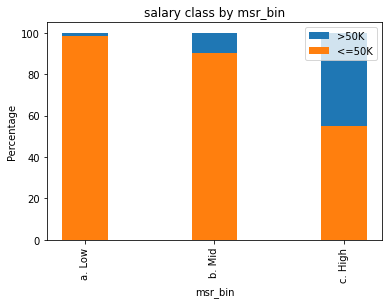

In [ ]:
 # call funtion
 variables_graph('msr_bin')

Occupation (5 bins)


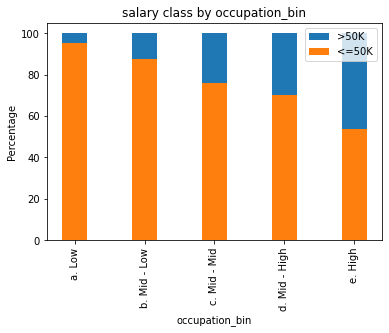

In [ ]:
 # call funtion
 variables_graph('occupation_bin')

Race and Sex (3 bins)

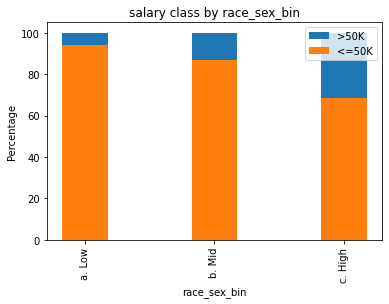

In [ ]:
 # call funtion
 variables_graph('race_sex_bin')

 # **4. Build Decision Tree Classifier Models**

In [ ]:
#slice the dataset into train and test dataset by flag
train= df[df['flag']=='train']
test= df[df['flag']=='test']

In [ ]:
#slice the dataset into x and y dataset
# x is independent variables
# y is the target column
X_train = train.iloc[:, :-3].values
X_test = test.iloc[:, :-3].values
y_train = train.iloc[:, -2:-1].values
y_test = test.iloc[:, -2:-1].values

In [ ]:
#Encoding the Independent Variable
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
ct =make_column_transformer((OneHotEncoder(),slice(0,9)))
X_train=ct.fit_transform(X_train)
X_test=ct.fit_transform(X_test)

In [ ]:
print(X_train)

In [ ]:
print(X_test)

In [ ]:
print(y_train)

In [ ]:
print(y_test)

In [ ]:
#Training the Decision Tree Classification model on the Training set, by default,thresholds=0.5
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(random_state = 101,max_depth=10,
                               max_features = None, min_samples_leaf=15)
dtree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [ ]:
#Predicting the Test set results
y_pred = dtree.predict(X_test)
y_pred

array([0, 0, 0, ..., 1, 0, 1])

 # **5.	Visualize Your Decision Tree using GraphViz**

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.955724 to fit



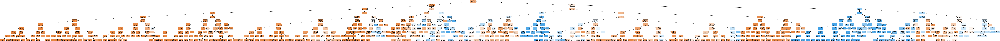

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

 # **6. Evaluate Decision Tree Performance**
 Calculate and display the following. Do all of these inside your Notebook.

1.  Confusion Matrix (TP, TN, FP, FN … etc.)
2.  Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)



In [ ]:
#1. Making the Confusion Matrix，get the accuracy score
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm) 
# true positives (TP):  we correctly predicted their salary greater than 50K
# true negatives (TN):  we correctly predicted their salary less than 50K(including 50K)
# false positives (FP): we incorrectly predicted their salary greater than 50K (a "Type I error")
# false negatives (FN): we incorrectly predicted their salary less than 50K  (a "Type II error")

# TN FP
# FN TP

[[11538   897]
 [ 1656  2190]]


In [ ]:
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

In [ ]:
# 2. Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)
#Accuracy
accuracy_score(y_test, y_pred)

0.8431914501566243

In [ ]:
#Precision, Recall, F1 Score
from sklearn.metrics import precision_recall_fscore_support as score
precision, recall, fscore, support = score(y_test, y_pred)
print('precision: {}'.format(precision))
print('recall: {}'.format(recall))
print('fscore: {}'.format(fscore))

precision: [0.8744884  0.70942663]
recall: [0.9278649  0.56942278]
fscore: [0.90038628 0.63176114]


In [ ]:
# average=None,the scores for each class are returned
#'micro':Calculate metrics globally by counting the total true positives, false negatives and false positives
#'macro':Calculate metrics for each label, and find their unweighted mean. This does not take label imbalance into account.
#'weighted':Calculate metrics for each label, and find their average weighted by support (the number of true instances for each label). This alters ‘macro’ to account for label imbalance; it can result in an F-score that is not between precision and recall.
# more see : https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html

In [ ]:
#AUC Value,AUC is the percentage of the ROC plot that is underneath the curve, Higher value = better classifier
from sklearn import metrics
print(metrics.roc_auc_score(y_test, y_pred))

0.748643837188952


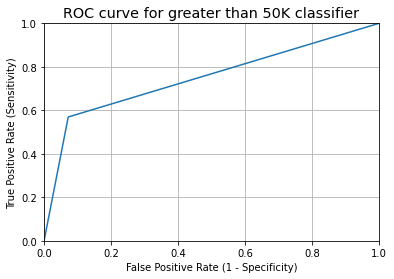

In [ ]:
#Receiver Operating Characteristic (ROC) Curves
#from sklearn import metrics
import matplotlib.pyplot as plt
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for greater than 50K classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.grid(True)

# **7.	Tune Decision Tree Performance**
Four Hyperparameters to vary:
*	Split Criteria – ‘Entropy’ or ‘Gini Impurity’
*	Minimum Sample Split – Minimum number of records required in any node for a further split to be attempted
*	Minimum Sample Leaf – Minimum of samples in a leaf node to stop further splitting (becomes a leaf node)
*	Maximum Depth – Maximum depth of the tree allowed



In [ ]:
# change criterion,max_depth=15,min_samples_leaf,min_samples_split mannually

In [ ]:
dtree1 = DecisionTreeClassifier(random_state = 101,criterion = 'gini',max_depth=15,
                                min_samples_leaf=20,min_samples_split=8)
dtree1.fit(X_train, y_train)
#Predicting the Test set results
y_pred = dtree1.predict(X_test)

In [ ]:
#Accuracy
print(accuracy_score(y_test, y_pred))

0.8440513481972852


In [ ]:
precision, recall, fscore, support = score(y_test, y_pred,average='binary')
print('precision: {}'.format(precision))
print('recall: {}'.format(recall))
print('fscore: {}'.format(fscore))

precision: 0.7147551758133421
recall: 0.5655226209048362
fscore: 0.6314414283640586


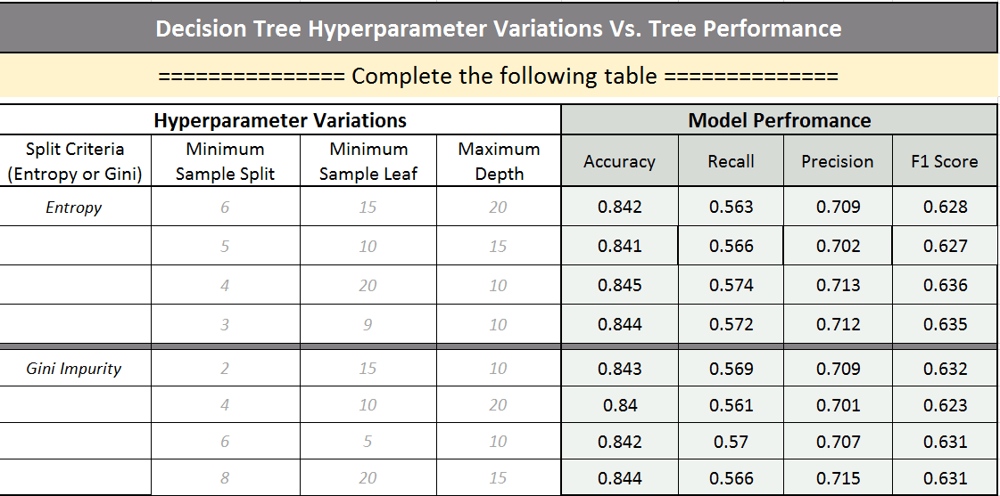

# **8.	Conclusion**


*   Q.8.1	How long was your total run time to train the model? 






In [ ]:
%time dtree.fit(X_train, y_train)
#sys: 3.3 ms, total: 250 ms, runtime: 246.7

CPU times: user 253 ms, sys: 996 µs, total: 254 ms
Wall time: 263 ms


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

*   Q.8.2	Did you find the BEST TREE? 

Yes, i found the best tree after tuning performance. Out of eight tunings, There is one three has higher score acorss four attributes: accuracy(0.845), F1 store(0.636), recall(0.574), and the second highest precision(0.713) .

*   Q.8.3	Draw the Graph of the BEST TREE Using GraphViz



In [ ]:
# create best tree
dtree_best = DecisionTreeClassifier(random_state = 101,criterion = 'entropy',max_depth=10,
                                min_samples_leaf=20,min_samples_split=4)
dtree_best.fit(X_train, y_train)
y_pred = dtree_best.predict(X_test)

In [ ]:
#best model accuracy score
print(accuracy_score(y_test, y_pred))

0.8448498249493275


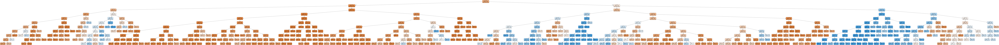

In [ ]:
#Visualization
dot_data = StringIO()
export_graphviz(dtree_best, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

*   Q.8.4	What makes it the best tree?

These four attributes input make the best tree: criterion = 'entropy', max_depth=10, min_samples_leaf=20, min_samples_split=4

# **9.  Automation of Performance Tuning**


Can you “automate” generation of the above “Hyperparameter Vs. Model Performance Table” in your code itself and display the table in your Notebook? 

In [ ]:
#reference
#from sklearn.metrics import recall_score
#from sklearn.metrics import precision_score
#from sklearn.metrics import f1_score

In [ ]:
# import the dataset with variable information 
df_tuning= pd.read_csv('Tuning_test2.csv',header=0)
# change column value for further use
df_tuning['Split Criteria (Entropy or Gini)']=df_tuning['Split Criteria (Entropy or Gini)'].replace({'Entropy': 'entropy', 'Gini Impurity': 'gini'})

In [ ]:
results = [] # creat an empty plist
for row in range(8):
    row=df_tuning.iloc[row,:]
    cr = row[0]
    mss = row[1]
    msl =row[2]
    md =row[3]
    dtree_auto = DecisionTreeClassifier(random_state = 101,criterion = cr,max_depth=md,
                                    min_samples_leaf=msl,min_samples_split=mss)
    dtree_auto.fit(X_train, y_train)
    y_pred = dtree_auto.predict(X_test)
    precision, recall, fscore, support = score(y_test, y_pred,average='binary')
    accuracy1 =accuracy_score(y_test, y_pred)
    result_summary= [accuracy1,recall,precision,fscore]
    results.append(result_summary)

df_tuning.iloc[:,4:8] = results # put list into dataframe
df_tuning.round(3)

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,6,15,20,0.842,0.563,0.709,0.628
1,entropy,5,10,15,0.841,0.566,0.702,0.627
2,entropy,4,20,10,0.845,0.574,0.713,0.636
3,entropy,3,9,10,0.844,0.572,0.713,0.635
4,gini,2,15,10,0.843,0.569,0.709,0.632
5,gini,4,10,20,0.840,0.561,0.701,0.623
6,gini,6,5,10,0.843,0.570,0.707,0.631
7,gini,8,20,15,0.844,0.566,0.715,0.631


# **10.	Prediction using your “trained” Decision Tree Model**

Based on the Performance Tuning effort in the previous section, pick your BEST PERFORMING TREE. Now make prediction of a “new” individual’s Income Category ( <=50K, or >50K ) with the following information. Do this in your Notebook.
*	Hours Worked per Week = 48
*	Occupation Category = Mid - Low
*	Marriage Status & Relationships = High
*	Capital Gain = Yes
*	Race-Sex Group = Mid
*	Number of Years of Education = 12
*	Education Category = High
*	Work Class = Income
*	Age = 58




In [ ]:
#slice the orginal dataset 
test=train.iloc[:, :-3]

In [ ]:
# put test date value into categorical class then create a dictionary
#test['age_bin'].unique()
new_row = {'hours_per_week_bin':'d. 41-50 & 61-70', 'occupation_bin':'b. Mid - Low', 'msr_bin':'c. High', 'capital_gl_bin':'c. > 0',
           'race_sex_bin':'b. Mid','education_num_bin':'b. 9-12','education_bin':'e. High','workclass_bin':'b. income','age_bin':'d. 36-40 & 56-60'}

In [ ]:
#append that new row to test dataset and store it to data_teast
data_test = test.append(new_row, ignore_index=True)
#onehotcode dataset
data_test=ct.fit_transform(data_test)

In [ ]:
#Predicting the Test set results
dtree_best = DecisionTreeClassifier(random_state = 101,criterion = 'entropy',max_depth=10,
                                min_samples_leaf=20,min_samples_split=4)
dtree_best.fit(X_train, y_train)
print(dtree_best.predict(data_test[-1,:]))
# y=1, more than 50K

[1]


What is the probability that your prediction for this person is accurate?

The prediction is that person's salary is greater than 50K, the best model accruacy score is 0.845. 84.5% probability that your prediction for this person is accurate